<a href="https://colab.research.google.com/github/Fatikah002/PCVK_Fatikah/blob/main/Week3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np

## D1. Operasi Citra Sederhana

 Mengubah tingkat kecerahan citra 
----------------------------------
Masukkan nilai kecerahan: 50


/tmp/ipython-input-337125712.py:16: RuntimeWarning: overflow encountered in scalar add
  brightness_image[y,x,c] = np.clip(resized[y,x,c] + brightness, 0, 255)


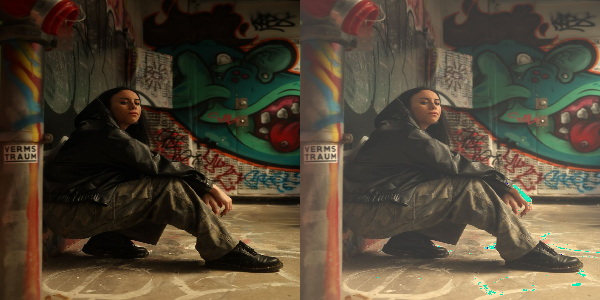

In [ ]:
print(' Mengubah tingkat kecerahan citra ')
print('----------------------------------')
try:
  brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK_MM/Images/female.tiff')
resized = cv.resize(original, (300, 300))
brightness_image = np.zeros(resized.shape, resized.dtype)

#akses per piksel
for y in range(resized.shape[0]):
  for x in range(resized.shape[1]):
    for c in range(resized.shape[2]):
      brightness_image[y,x,c] = np.clip(resized[y,x,c] + brightness, 0, 255)

#cara simple tanpa for loop
#brightness_image = cv.convertScaleAbs(original, beta-brightness)

final_frame = cv.hconcat((resized, brightness_image))
cv2_imshow(final_frame)


## Tugas Praktikum D1

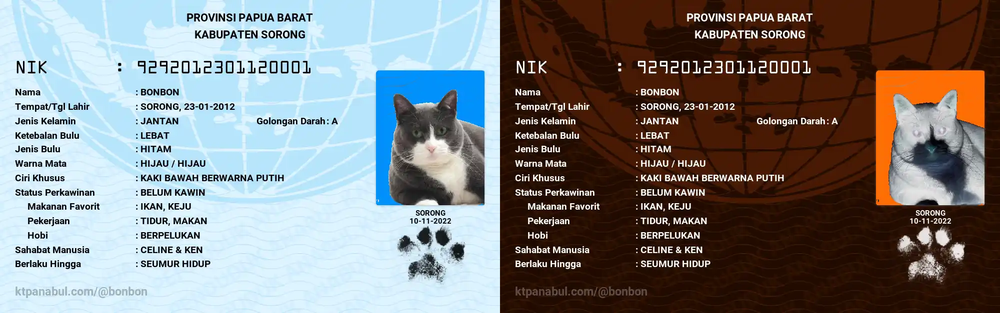

In [ ]:
#1
original = cv.imread('/content/drive/MyDrive/PCVK_MM/Images/KTP.webp')

# Inverse
inverse_img = 255 - original


final_frame = cv.hconcat([original, inverse_img])
cv2_imshow(final_frame)

Mengubah kontras dan tingkat kecerahan citra
--------------------------------------------
Masukkan tingkat kecerahan [-255 - 255]: 50
Masukkan kontras [1.0 - 3.0]: 2


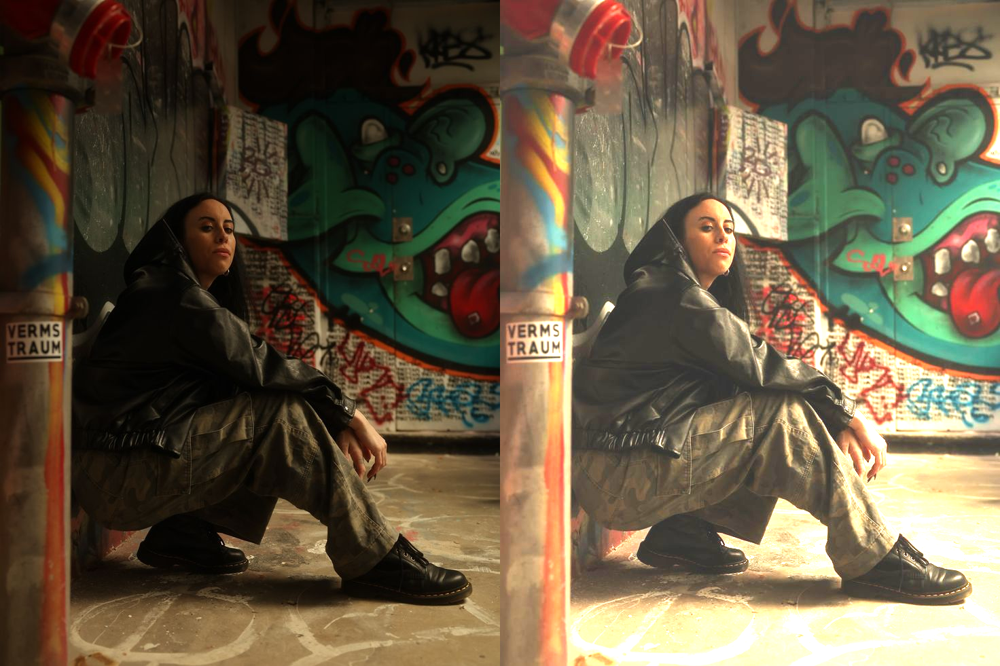

In [ ]:
#2
print("Mengubah kontras dan tingkat kecerahan citra")
print("--------------------------------------------")

try:
    brightness = int(input("Masukkan tingkat kecerahan [-255 - 255]: "))
    contrast = float(input("Masukkan kontras [1.0 - 3.0]: "))
except ValueError:
    print("Error, input bukan angka")
    brightness, contrast = 0, 1.0


original = cv.imread('/content/drive/MyDrive/PCVK_MM/Images/female.tiff')

def apply_contrast_brightness(img, contrast, brightness):
    out = np.clip(contrast * img + brightness, 0, 255)
    return out.astype(np.uint8)

result = apply_contrast_brightness(original, contrast, brightness)

final = cv.hconcat([original, result])
cv2_imshow(final)

Mengubah tingkat kecerahan citra dengan Transformasi Log
--------------------------------------------------------
Masukkan nilai kecerahan: 50


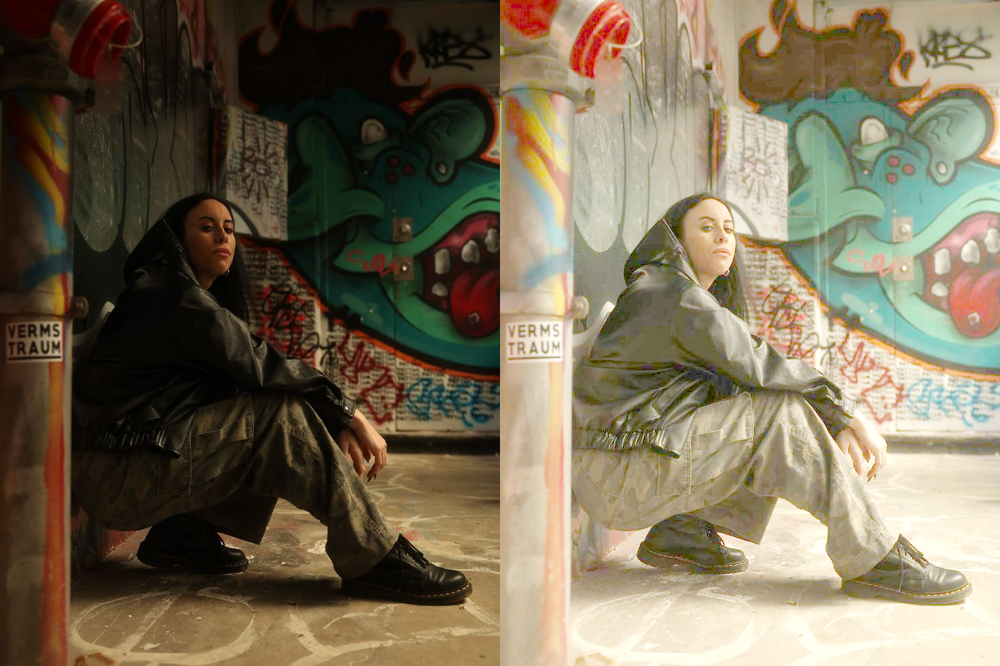

In [ ]:
#3
print("Mengubah tingkat kecerahan citra dengan Transformasi Log")
print("--------------------------------------------------------")

try:
    c = int(input("Masukkan nilai kecerahan: "))
except ValueError:
    print("Error, input bukan angka")
    c = 1

original = cv.imread('/content/drive/MyDrive/PCVK_MM/Images/female.tiff')

# Transformasi log brightness
log_img = c * np.log(1 + original.astype(np.float32))
log_img = np.clip(log_img, 0, 255).astype(np.uint8)

final = cv.hconcat([original, log_img])
cv2_imshow(final)

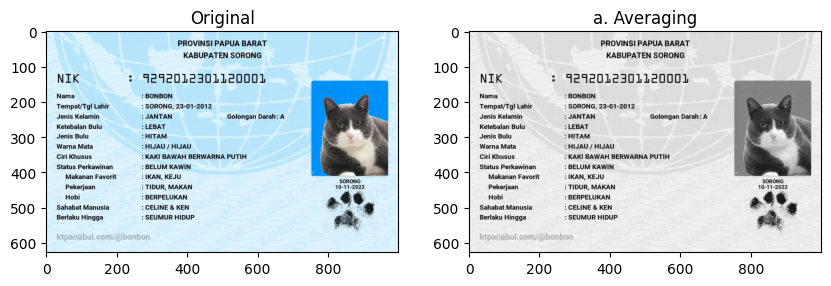

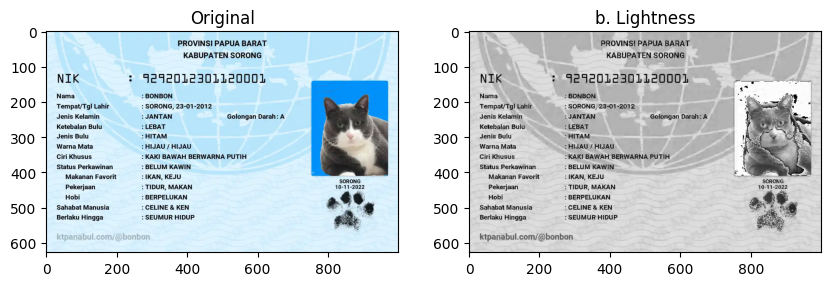

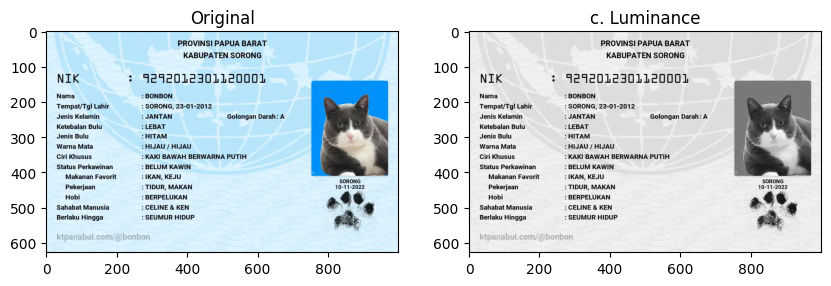

In [ ]:
#4
img = cv.imread('/content/drive/MyDrive/PCVK_MM/Images/KTP.webp')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)


R, G, B = img[:,:,0], img[:,:,1], img[:,:,2]

# a. Averaging
avg = ((R.astype(np.float32) + G.astype(np.float32) + B.astype(np.float32)) / 3).astype(np.uint8)

plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(img)
plt.title("Original")

plt.subplot(1,2,2)
plt.imshow(avg, cmap="gray")
plt.title("a. Averaging")
plt.show()

# b. Lightness
lightness = ((np.maximum(np.maximum(R,G),B) + np.minimum(np.minimum(R,G),B)) / 2).astype(np.uint8)

plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(img)
plt.title("Original")

plt.subplot(1,2,2)
plt.imshow(lightness, cmap="gray")
plt.title("b. Lightness")
plt.show()

#c. Luminance
luminance = (0.21*R + 0.72*G + 0.07*B).astype(np.uint8)

plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(img)
plt.title("Original")

plt.subplot(1,2,2)
plt.imshow(luminance, cmap="gray")
plt.title("c. Luminance")
plt.show()


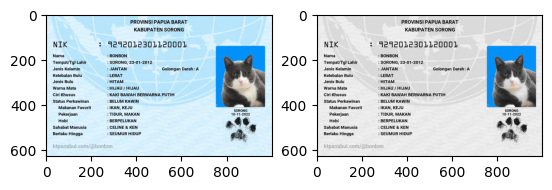

In [ ]:
#5
img = cv.imread('/content/drive/MyDrive/PCVK_MM/Images/KTP.webp')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
hsv = cv.cvtColor(img, cv.COLOR_RGB2HSV)

# range warna biru
mask_blue = cv.inRange(hsv, (60,155,155), (255,255,255))
# range warna wajah
mask_face = cv.inRange(hsv, (0,30,60), (20,150,255))
# menggabungkan warna
mask = cv.bitwise_or(mask_blue, mask_face)

gray = cv.cvtColor(img, cv.COLOR_RGB2GRAY)
gray = cv.cvtColor(gray, cv.COLOR_GRAY2RGB)
result = np.where(mask[:,:,None] != 0, img, gray)

plt.subplot(1,2,1); plt.imshow(img)
plt.subplot(1,2,2); plt.imshow(result)
plt.show()


## D2. Operasi Aritmatika dan Logika

 Gamma Correction pada citra 
----------------------------------
Masukkan nilai Gamma: 3


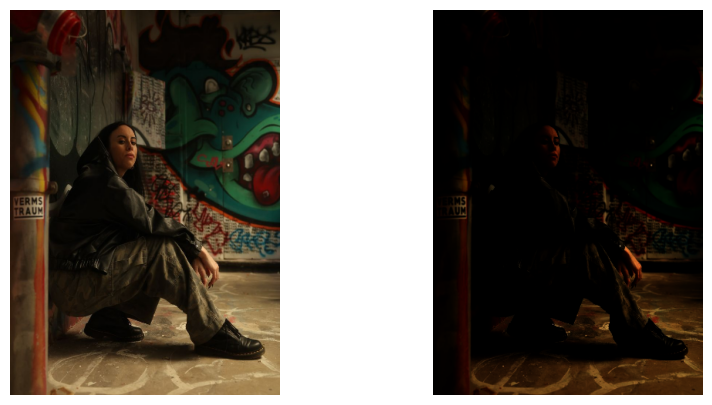

In [ ]:
#1

img = cv.imread('/content/drive/MyDrive/PCVK_MM/Images/female.tiff')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
resized = cv.resize(img, (350, 500))
print(' Gamma Correction pada citra ')
print('----------------------------------')

try:
    gamma = int(input('Masukkan nilai Gamma: '))
except ValueError:
    print('Error, not a number')
    gamma = 1
#Proses gamma correction
gamma_corrected = np.array(255 * (resized / 255.0) ** gamma, dtype='uint8')

plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.imshow(resized)
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(gamma_corrected)
plt.axis("off")

plt.show()

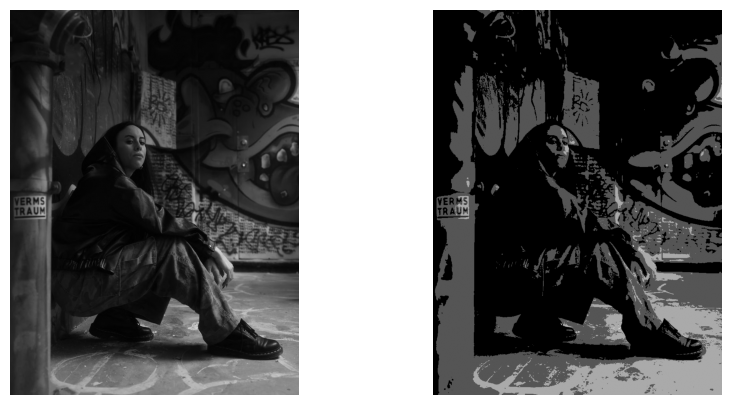

In [ ]:
bit_depth = 2
# hitung faktor skala
level = 255 / (pow(2, bit_depth) - 1)

original = cv.imread('/content/drive/MyDrive/PCVK_MM/Images/female.tiff', cv.IMREAD_GRAYSCALE)

# array kosong untuk hasil
depth_image = np.zeros(original.shape, original.dtype)

# Lakukan kuantisasi per piksel
for i in range(original.shape[0]):         # loop baris
    for j in range(original.shape[1]):     # loop kolom
        # Pembulatan ke level terdekat
        depth_image[i, j] = round(original[i, j] / level) * level


plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.imshow(original, cmap='gray')
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(depth_image, cmap='gray')
plt.axis("off")

plt.show()

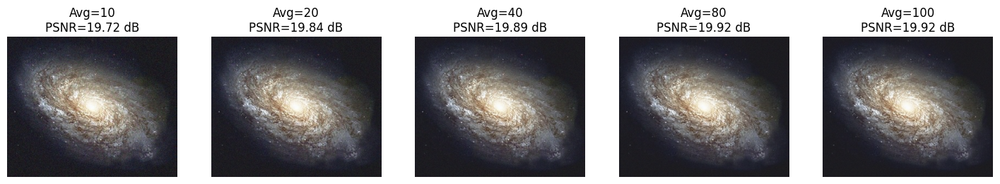

In [ ]:
import glob

# ---------- 1. Baca citra asli ----------
path_original = '/content/drive/MyDrive/PCVK/Images/galaxy.jpg'
original = cv.imread(path_original)

if original is None:
    raise FileNotFoundError(f"Citra asli tidak ditemukan di {path_original}")

# ---------- 2. Baca semua citra noisy dari folder ----------
cv_img = []
for img in glob.glob('/content/drive/MyDrive/PCVK/Images/noises/*.jpg'):
    n = cv.imread(img)
    if n is not None:
        cv_img.append(n)

cv_img = np.array(cv_img)

# ---------- 3. Fungsi MSE ----------
def mse(img1, img2):
    return np.mean((img1.astype("float") - img2.astype("float")) ** 2)

# ---------- 4. Fungsi PSNR ----------
def psnr(img1, img2):
    m = mse(img1, img2)
    if m == 0:  # jika sama persis
        return 100
    return 10 * np.log10((255.0 ** 2) / m)

# ---------- 5. Jumlah citra untuk di-average ----------
averages = [10, 20, 40, 80, 100]

# ---------- 6. Plot hasil ----------
fig, axs = plt.subplots(1, len(averages), figsize=(18,5))
for i, num in enumerate(averages):
    subset = cv_img[:num]
    avg_img = np.mean(subset, axis=0).astype(np.uint8)
    score = psnr(original, avg_img)

    axs[i].imshow(cv.cvtColor(avg_img, cv.COLOR_BGR2RGB))
    axs[i].set_title(f"Avg={num}\nPSNR={score:.2f} dB")
    axs[i].axis('off')

plt.show()

### Kesimpulan
10 citra (19.72 dB)
→ Hasil sudah lebih baik daripada citra tunggal, tetapi noise masih cukup terlihat.

20 citra (19.84 dB)
→ PSNR naik sedikit, citra mulai terlihat lebih halus.

40 citra (19.89 dB)
→ Kualitas meningkat lagi, namun kenaikan PSNR makin kecil.

80 citra (19.92 dB)
→ Citra semakin mendekati asli, tetapi peningkatan hampir tidak signifikan dibanding 40 citra.

100 citra (19.92 dB)
→ Nilai PSNR tidak bertambah banyak, artinya proses averaging sudah mencapai titik stabil (konvergen).

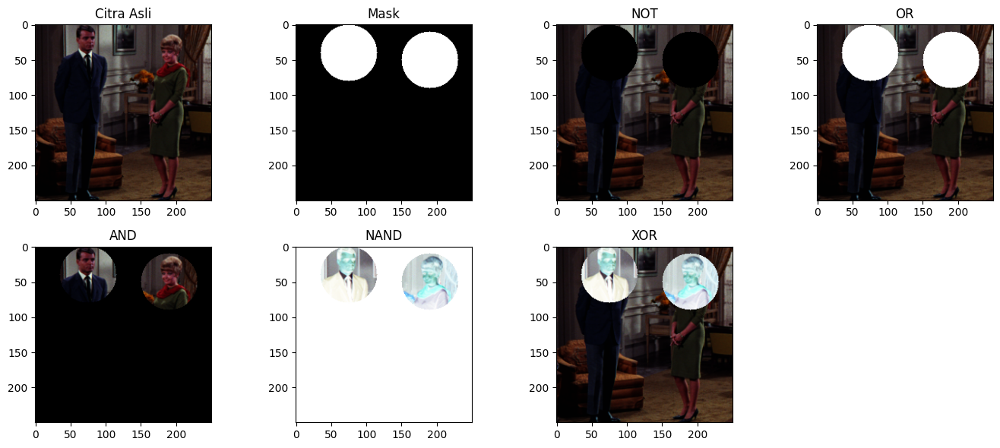

In [ ]:
#4
# Baca dan resize citra
img = cv.cvtColor(cv.imread('/content/drive/MyDrive/PCVK/Images/couple.tiff'), cv.COLOR_BGR2RGB)
img = cv.resize(img, (250, 250))

# Buat mask
mask = np.zeros((250, 250), dtype="uint8")
cv.circle(mask, (75, 40), 40, 255, -1)
cv.circle(mask, (190, 50), 40, 255, -1)
mask_3 = cv.merge([mask]*3)

# Operasi bitwise
not_result = cv.bitwise_and(img, cv.bitwise_not(mask_3))
or_result = cv.bitwise_or(img, mask_3)
and_result = cv.bitwise_and(img, mask_3)
nand_result = cv.bitwise_not(and_result)
xor_result = cv.bitwise_xor(img, mask_3)

# Tampilkan hasil
plt.figure(figsize=(14,6))
for i, (image, title) in enumerate(zip(
    [img, mask_3, not_result, or_result, and_result, nand_result, xor_result],
    ['Citra Asli', 'Mask', 'NOT', 'OR', 'AND', 'NAND', 'XOR']
)):
    plt.subplot(2,4,i+1)
    plt.imshow(image)
    plt.title(title)
plt.tight_layout()
plt.show()

### Kesimpulan
1. NOT
* bagian yang sebelumnya dipilih lingkaran menjadi hitam, dan area di luar lingkaran tetap tampak.
2. OR
* semua piksel di area lingkaran kiri maupun kanan akan ditampilkan, tetapi lingkaran akan tampil berwarna putih.
3. AND
* Menampilkan hanya tampilan dua lingkaran
4. NAND (NOT AND)
* Menampilkan semua piksel kecuali yang berada di irisan kedua lingkaran.
5. XOR (Exclusive OR)
* Menampilkan piksel yang ada di salah satu lingkaran, tetapi tidak di keduanya
